In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
import scipy.stats as stats 
from datetime import datetime, date 
import statsmodels.api as sm
from pylab import rcParams
rcParams['figure.figsize'] = 12, 6
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot
import warnings 
warnings.filterwarnings('ignore')
import pickle
from sklearn.model_selection import train_test_split
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error



Import the data 

In [ ]:
data_dehire = pd.read_csv(r'/content/drive/MyDrive/Dehire1.csv',)
data_dehire.head()

,POSTING_DATE,EFFECTIVE_DATE,CREATE_DATE,TRANSFER_IN_EFFECTIVE_DATE,Customer_Vendor_Code,Customer_Vendor_Name,LOB,Region,BP_TYPE,City,...,U_DocStatus,NumAtCard,U_SOTYPE,BP_CATEGORY,Document_Type,TRANSPORTER_NAME,U_GRNNO,Loading_Unloading,Detention,U_AssetClass
0,04/12/2019,04/12/2019,04/12/2019,NaN,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,NaN,NaN,Ecommerce,Dehire Received,LOGISTICS TECK LLP,NaN,1890.0,NaN,Wooden Pallet
1,04/12/2019,04/12/2019,04/12/2019,NaN,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,NaN,NaN,Ecommerce,Dehire Received,LOGISTICS TECK LLP,NaN,1890.0,NaN,Wooden Pallet
2,04/12/2019,04/12/2019,04/12/2019,NaN,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,NaN,NaN,Ecommerce,Dehire Received,LOGISTICS TECK LLP,NaN,1890.0,NaN,Wooden Pallet
3,04/12/2019,04/12/2019,04/12/2019,NaN,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,NaN,NaN,Ecommerce,Dehire Received,LOGISTICS TECK LLP,NaN,1890.0,NaN,Wooden Pallet
4,04/12/2019,04/12/2019,04/12/2019,NaN,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,NaN,NaN,Ecommerce,Dehire Received,LOGISTICS TECK LLP,NaN,1890.0,NaN,Wooden Pallet


In [ ]:
data_dehire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1838 entries, 0 to 1837
Data columns (total 37 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   POSTING_DATE                1838 non-null   object 
 1   EFFECTIVE_DATE              1838 non-null   object 
 2   CREATE_DATE                 1838 non-null   object 
 3   TRANSFER_IN_EFFECTIVE_DATE  0 non-null      float64
 4   Customer_Vendor_Code        1838 non-null   int64  
 5   Customer_Vendor_Name        1838 non-null   object 
 6   LOB                         1838 non-null   object 
 7   Region                      1838 non-null   object 
 8   BP_TYPE                     1838 non-null   object 
 9   City                        1838 non-null   object 
 10  STATE                       1838 non-null   object 
 11  From_WhsCode                1838 non-null   object 
 12  From_WhsName                1838 non-null   object 
 13  To_whsCode                  1838 

Load the data into SQL

In [ ]:
import sqlite3
from sqlalchemy import create_engine
import pandas as pd 

In [ ]:
engine = create_engine('sqlite:///dehire_database.db')


In [ ]:
data_dehire.to_sql(name = 'dehire_pallet',con=engine,if_exists='replace',index=False)


1838

In [ ]:
conn = sqlite3.connect('dehire_database.db')
cursor =conn.cursor()

In [ ]:
cursor.execute("SELECT name FROM sqlite_master WHERE type ='table';")

In [ ]:
tables = cursor.fetchall()


In [ ]:
for table in tables:
  print(table)

('dehire_pallet',)


In [ ]:
conn.close


<function Connection.close>

In [ ]:
conn = sqlite3.connect("dehire_database.db")
cursor = conn.cursor()

In [ ]:
table = 'dehire_pallet'


In [ ]:
cursor.execute(f"SELECT * FROM {table}")
data = cursor.fetchall()

In [ ]:
main_dehire=pd.DataFrame(data)
conn.close()


In [ ]:
main_dehire.columns = ['POSTING DATE','EFFECTIVE DATE','CREATE DATE','TRANSFER IN EFFECTIVE DATE','Customer/Vendor Code','Customer/Vendor Name','LOB',
                       'Region','BP TYPE','City ','STATE','From WhsCode','From WhsName ','To Whscode','To WhsName ','Model TYPE','Transfer Type','U_Frt','U_ActShipType','PRODUCT CATEGORY',
                       'ItemCode','QUANTITY','UNIT','RATE','SO ID','SO Creation Date','SO Due Date','U_DocStatus','NumAtCard ','U_SOTYPE','BP CATEGORY',
                       'Document Type','TRANSPORTER NAME','U_GRNNO','Loading/Unloading','Detention','U_AssetClass']
main_dehire                      

,POSTING DATE,EFFECTIVE DATE,CREATE DATE,TRANSFER IN EFFECTIVE DATE,Customer/Vendor Code,Customer/Vendor Name,LOB,Region,BP TYPE,City,...,U_DocStatus,NumAtCard,U_SOTYPE,BP CATEGORY,Document Type,TRANSPORTER NAME,U_GRNNO,Loading/Unloading,Detention,U_AssetClass
0,04/12/2019,04/12/2019,04/12/2019,None,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,1890.0,NaN,Wooden Pallet
1,04/12/2019,04/12/2019,04/12/2019,None,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,1890.0,NaN,Wooden Pallet
2,04/12/2019,04/12/2019,04/12/2019,None,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,1890.0,NaN,Wooden Pallet
3,04/12/2019,04/12/2019,04/12/2019,None,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,1890.0,NaN,Wooden Pallet
4,04/12/2019,04/12/2019,04/12/2019,None,10001548,Cart Services Pvt. Ltd. _ Bhiwandi _Antariksh ...,FMCG,West,RENTAL,Bhiwandi,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,1890.0,NaN,Wooden Pallet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,29/11/2022,29/11/2022,29/11/2022,None,10006524,Cart Services Pvt. Ltd. _ Hyderabad _Pudur,FMCG,South,RENTAL,Hyderabad,...,C,None,None,Ecommerce,Dehire Received,Customer Transport,None,NaN,NaN,Wooden Pallet
1834,29/11/2022,25/11/2022,29/11/2022,None,10002429,Cart Services Pvt. Ltd. _ Patna _Bihta,FMCG,East,RENTAL,Patna,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,0.0,0.0,Wooden Pallet
1835,29/11/2022,26/11/2022,29/11/2022,None,10002429,Cart Services Pvt. Ltd. _ Patna _Bihta,FMCG,East,RENTAL,Patna,...,C,None,None,Ecommerce,Dehire Received,LOGISTICS TECK LLP,None,0.0,0.0,Wooden Pallet
1836,29/11/2022,29/11/2022,29/11/2022,None,10006524,Cart Services Pvt. Ltd. _ Hyderabad _Pudur,FMCG,South,RENTAL,Hyderabad,...,C,None,None,Ecommerce,Dehire Received,Customer Transport,None,NaN,NaN,Wooden Pallet - SS


EDA

In [ ]:
main_dehire.shape

(1838, 37)

In [ ]:

main_dehire.nunique()


POSTING DATE                  421
EFFECTIVE DATE                463
CREATE DATE                   421
TRANSFER IN EFFECTIVE DATE      0
Customer/Vendor Code          140
Customer/Vendor Name          140
LOB                             1
Region                          4
BP TYPE                         1
City                           53
STATE                          18
From WhsCode                  143
From WhsName                  143
To Whscode                     32
To WhsName                     22
Model TYPE                      3
Transfer Type                   1
U_Frt                          41
U_ActShipType                   3
PRODUCT CATEGORY               11
ItemCode                       42
QUANTITY                      355
UNIT                            1
RATE                           35
SO ID                           0
SO Creation Date                0
SO Due Date                     0
U_DocStatus                     2
NumAtCard                       0
U_SOTYPE      

In [ ]:
null_col = main_dehire.columns[main_dehire.isnull().any()].tolist()
print('Columns with missing values:',null_col)

Columns with missing values: ['TRANSFER IN EFFECTIVE DATE', 'U_Frt', 'UNIT', 'RATE', 'SO ID', 'SO Creation Date', 'SO Due Date', 'NumAtCard ', 'U_SOTYPE', 'U_GRNNO', 'Loading/Unloading', 'Detention', 'U_AssetClass']


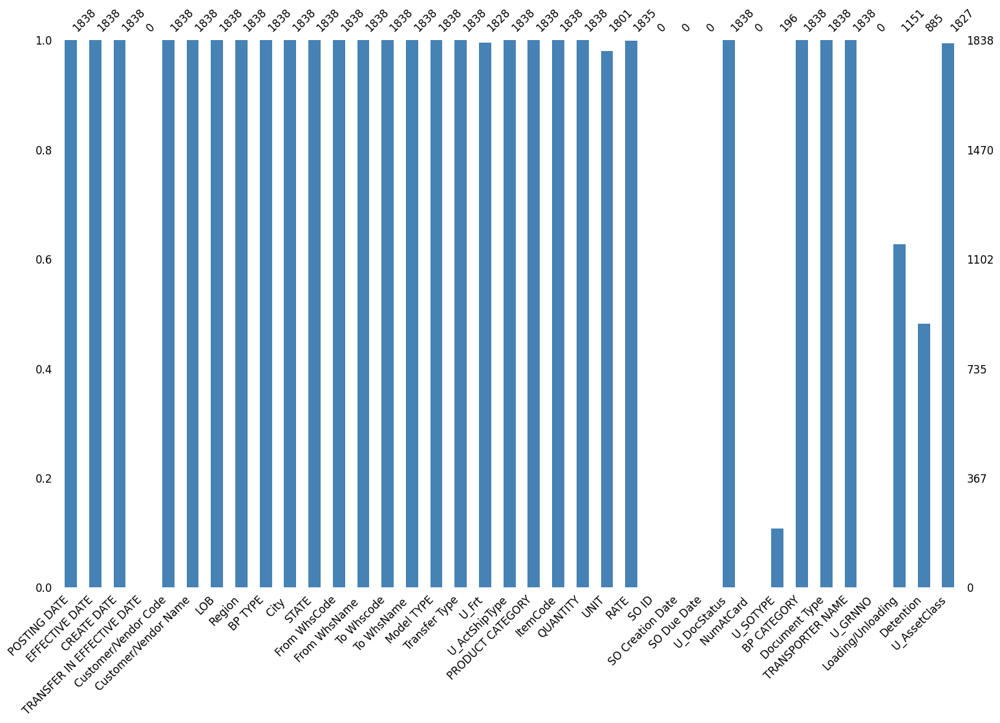

In [ ]:
import missingno as msno
msno.bar(main_dehire, figsize=(18, 11), fontsize=12, color='steelblue')
%matplotlib inline

In [ ]:
main_numeric = main_dehire.select_dtypes(include=['int64','float64']).columns
results = []
for col in main_numeric:
    result = {
        'Feature': col,
        'Mean': main_dehire[col].mean(),
        'Median': main_dehire[col].median(),
        'Mode': main_dehire[col].mode().tolist(),
        'Range': main_dehire[col].max() - main_dehire[col].min(),
        'Variance': main_dehire[col].var(),
        'Standard Deviation': main_dehire[col].std(),
        'Skewness': main_dehire[col].skew(),
        'Kurtosis': main_dehire[col].kurtosis()
    }
    results.append(result)

In [ ]:
EDA_dehire = pd.DataFrame(results)
EDA_dehire

,Feature,Mean,Median,Mode,Range,Variance,Standard Deviation,Skewness,Kurtosis
0,Customer/Vendor Code,1.000297e+07,10002210.0,[10002436],7536.0,4.138334e+06,2034.289587,0.914277,-0.879750
1,U_Frt,2.289231e+03,10.0,[1.0],26000.0,1.266889e+07,3559.337877,1.862604,4.469407
2,QUANTITY,-1.843112e+02,-190.0,[-300],1577.0,2.056158e+04,143.393110,-2.042824,14.626799
3,RATE,1.824169e+03,1950.0,[1950.0],16000.0,9.537512e+05,976.601880,8.091220,107.712303
4,Loading/Unloading,2.264935e+02,0.0,[0.0],6000.0,3.333439e+05,577.359398,3.800297,22.090400
5,Detention,0.000000e+00,0.0,[0.0],0.0,0.000000e+00,0.000000,0.000000,0.000000


drop the columns

In [ ]:
df =main_dehire.drop(['POSTING DATE','CREATE DATE','TRANSFER IN EFFECTIVE DATE','Customer/Vendor Name','LOB','Customer/Vendor Code',
                       'BP TYPE','City ','STATE','From WhsCode','From WhsName ','To Whscode','To WhsName ','Model TYPE','Transfer Type','U_ActShipType','PRODUCT CATEGORY',
                       'ItemCode','UNIT','SO ID','SO Creation Date','SO Due Date','U_DocStatus','NumAtCard ','U_SOTYPE','BP CATEGORY',
                       'Document Type','TRANSPORTER NAME','U_GRNNO','Loading/Unloading','Detention','U_AssetClass','Region','U_Frt','RATE'],axis=1)


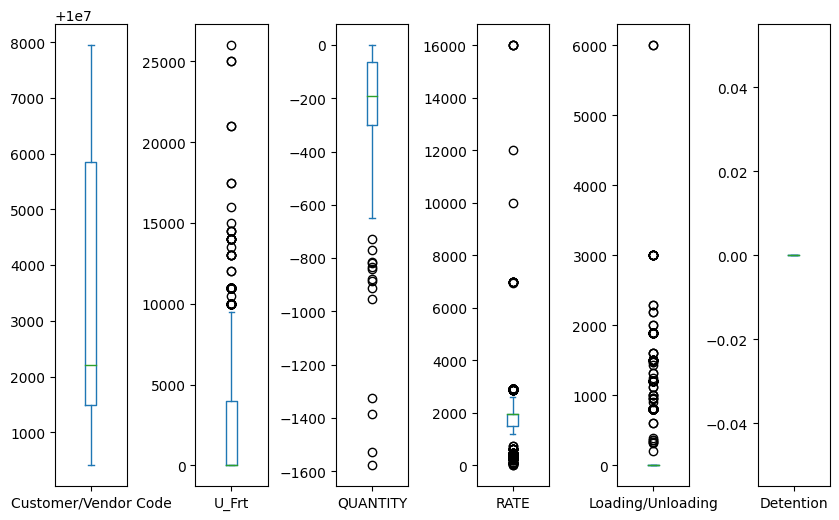

In [ ]:
#boxplot
main_dehire.plot(kind='box',subplots =True , sharey= False, figsize=(10,6))
plt.subplots_adjust(wspace = 0.95)
plt.show()

In [ ]:
#outliers 
outliers = ['U_Frt','QUANTITY','RATE','Loading/Unloading']
outliers

['U_Frt', 'QUANTITY', 'RATE', 'Loading/Unloading']

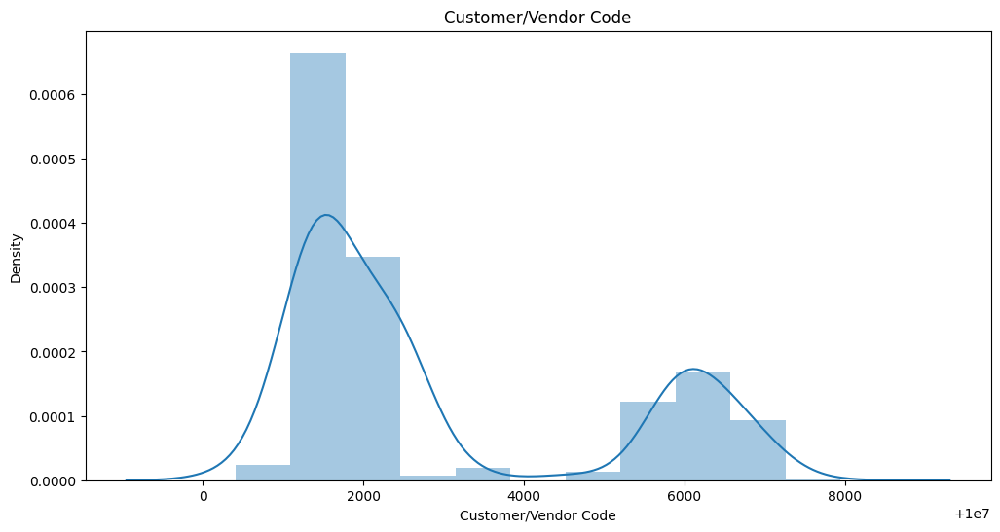

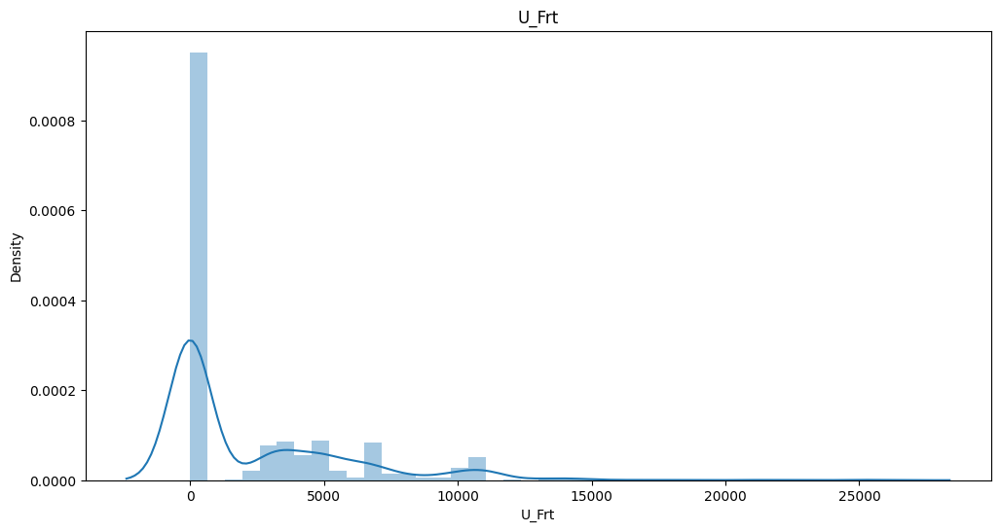

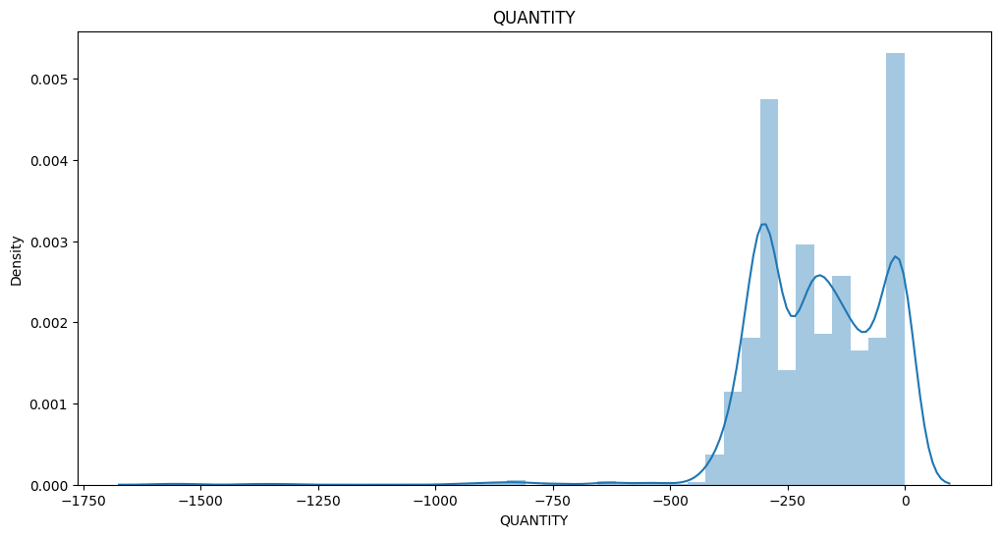

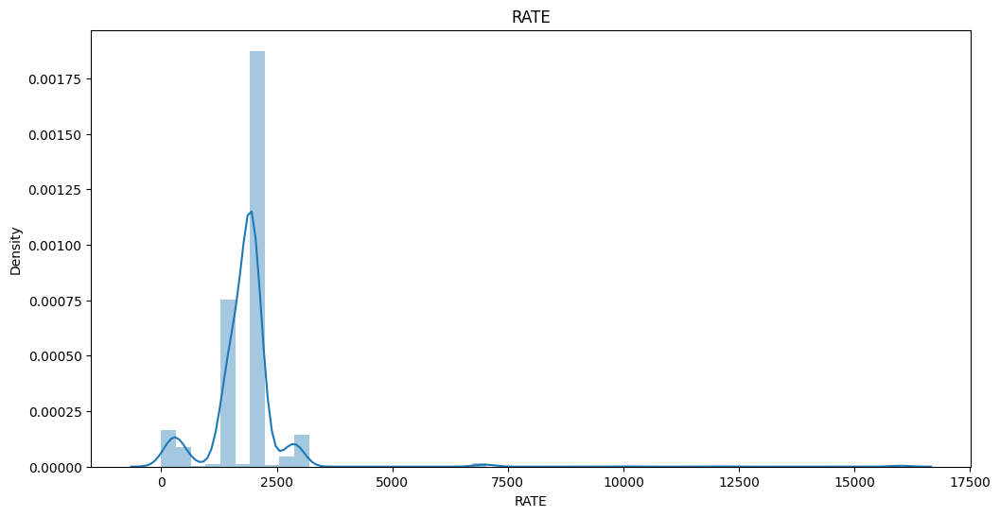

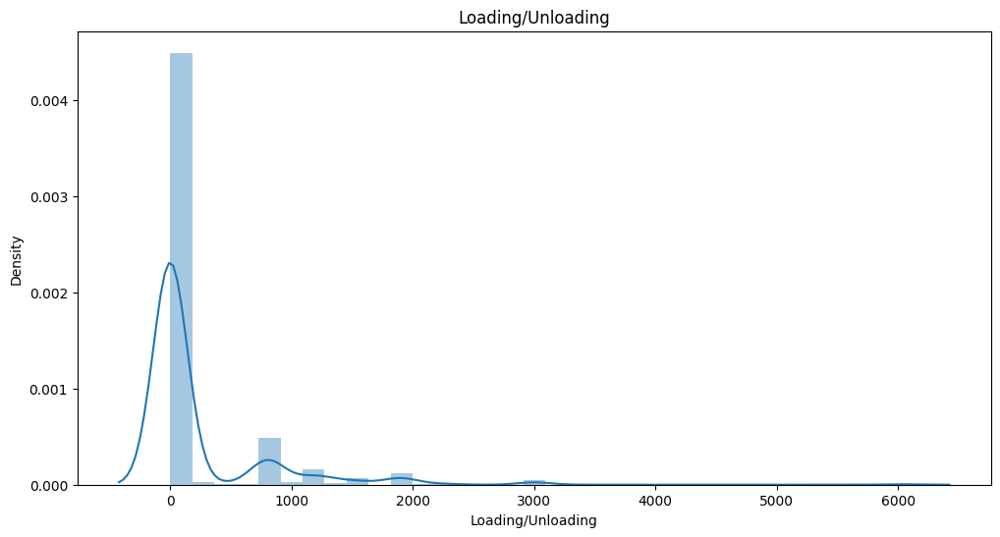

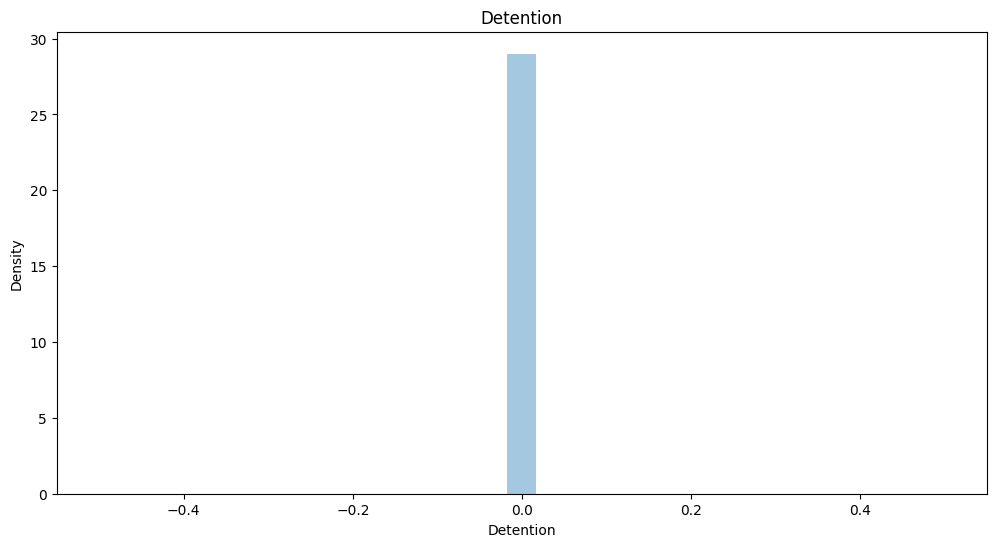

In [ ]:
#Density plot
for col in main_numeric:
  sns.distplot(main_dehire[col])
  plt.title(col)
  plt.show()

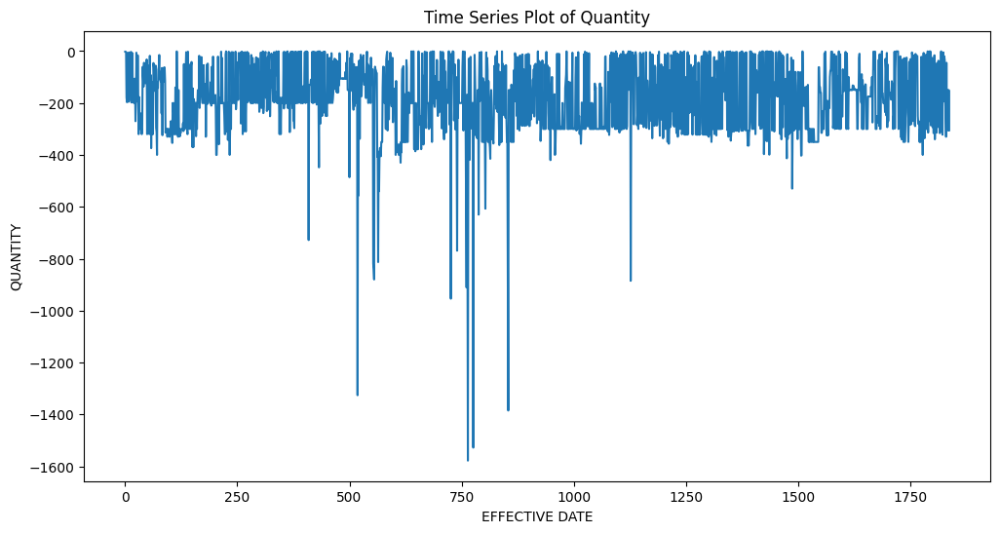

In [ ]:
#Time series plot 
plt.figure(figsize=(12, 6))
plt.plot(main_dehire.index, main_dehire['QUANTITY'])
plt.xlabel('EFFECTIVE DATE')
plt.ylabel('QUANTITY')
plt.title('Time Series Plot of Quantity')
plt.show()

###Auto Eda 

In [ ]:
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.4/67.4 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 38.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 40.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 kB 19.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.2/121.2 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 8.2 MB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-2.2.0-py3-none-any.whl size=234926 sha256=42aa728ecfd0a8f48411be163515cbe916c2c4a2b632bc8e974635a56db3d5eb
  Stored in directory: /root/.cache/pip/wheels/9a/b8/0f/f580817231cbf59f6ade9fd132ff60ada1de9f7dc85521f857
Successfully built emoji


Imported v0.1.601. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (1838, 37)
#######################################################################################
######################## C L A S S

,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
NumAtCard,100.000000,0.000000,object,0,1838,nan,"fill missing values, very high nulls percent: drop"
TRANSFER IN EFFECTIVE DATE,100.000000,0.000000,object,0,1838,nan,"fill missing values, very high nulls percent: drop"
U_GRNNO,100.000000,0.000000,object,0,1838,nan,"fill missing values, very high nulls percent: drop"
SO ID,100.000000,0.000000,object,0,1838,nan,"fill missing values, very high nulls percent: drop"
SO Creation Date,100.000000,0.000000,object,0,1838,nan,"fill missing values, very high nulls percent: drop"
SO Due Date,100.000000,0.000000,object,0,1838,nan,"fill missing values, very high nulls percent: drop"
U_SOTYPE,89.336235,0.163221,object,3,1642,3.000000,"fill missing values, fix mixed data types"
Detention,51.849837,0.054407,float64,1,953,0.000000,"fill missing values, invariant values: drop"
Loading/Unloading,37.377584,1.414581,float64,26,687,0.000000,"fill missing values, right skewed distribution: cap or drop outliers"
UNIT,2.013058,0.054407,object,1,37,1801.000000,"fill missing values, invariant values: drop, fix mixed data types"


    37 Predictors classified...
        12 variables removed since they were ID or low-information variables
        List of variables removed: ['TRANSFER IN EFFECTIVE DATE', 'LOB', 'BP TYPE', 'Transfer Type', 'UNIT', 'SO ID', 'SO Creation Date', 'SO Due Date', 'NumAtCard ', 'Document Type', 'U_GRNNO', 'Detention']
   Total columns > 30, too numerous to print.
Number of All Scatter Plots = 6


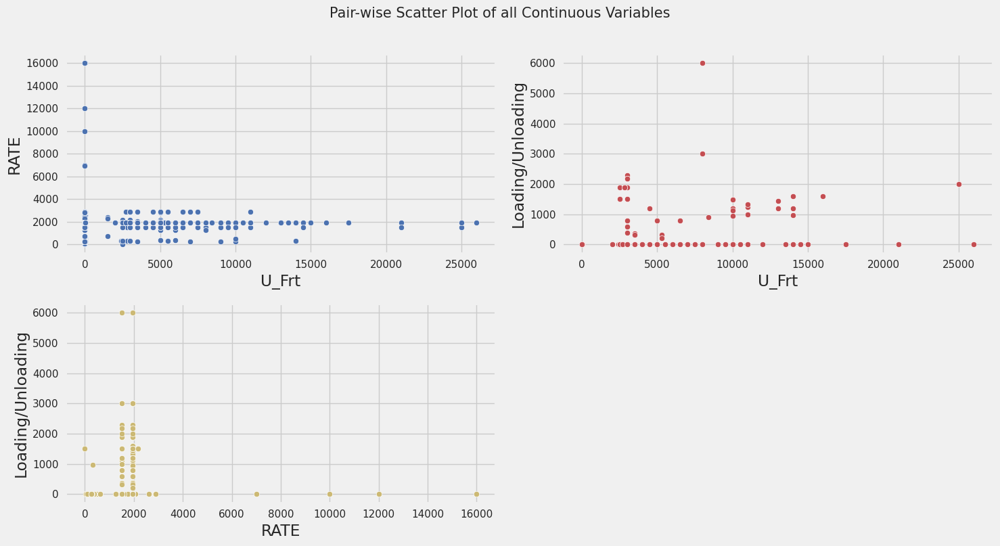

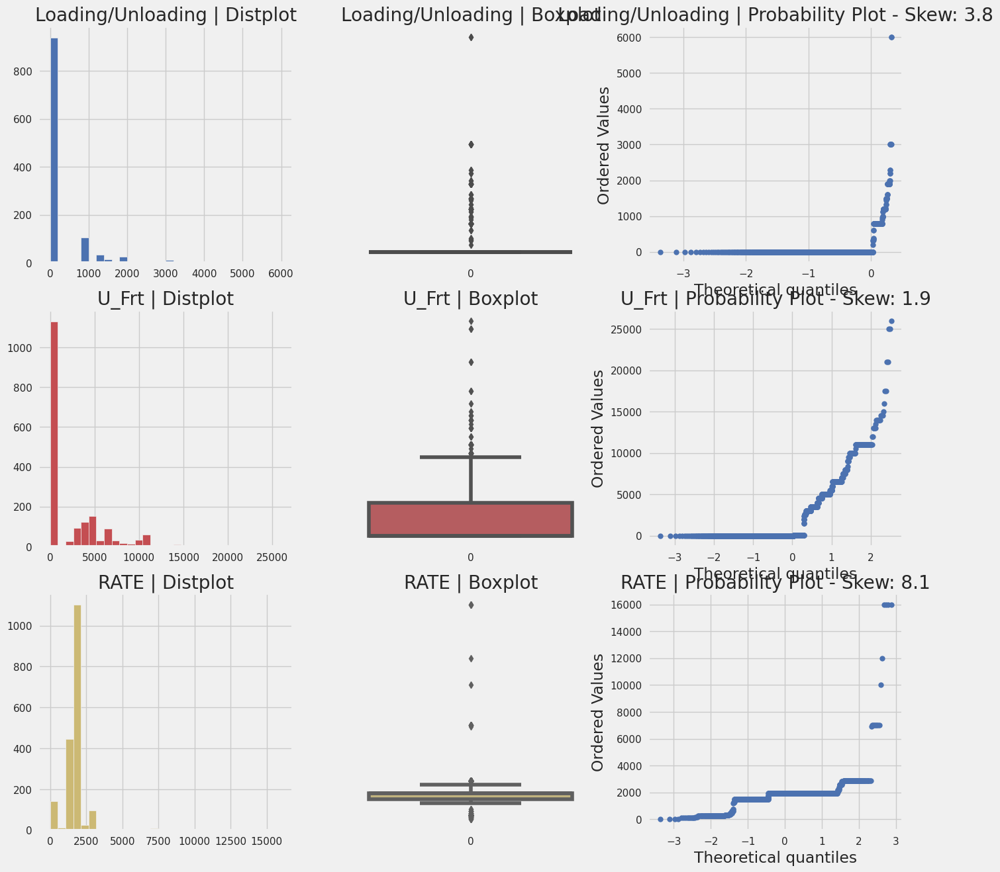

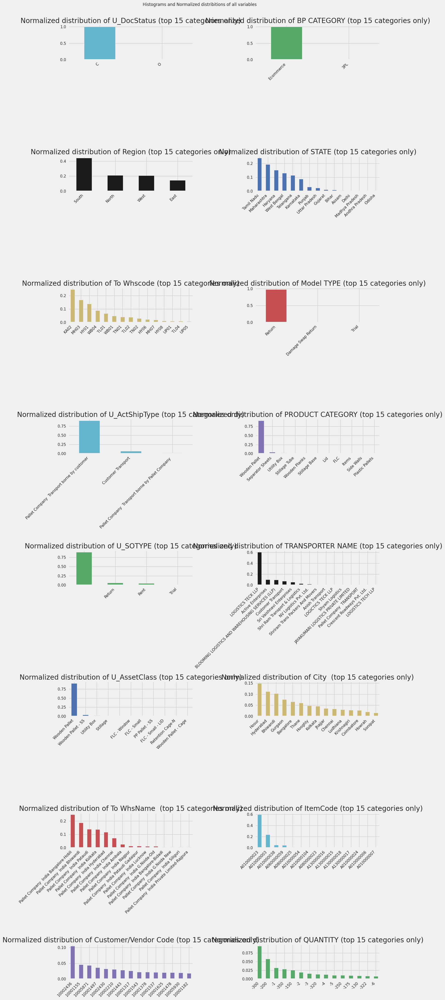

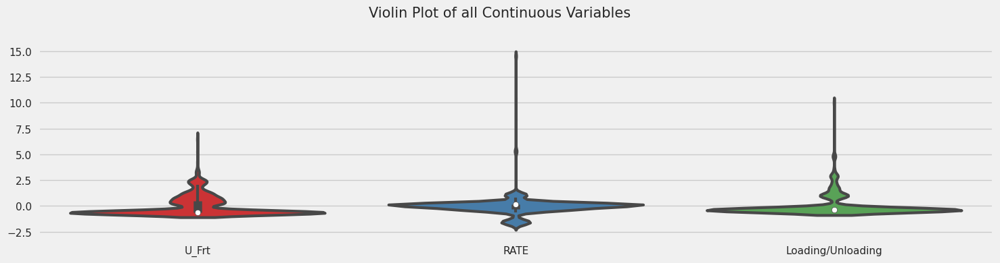

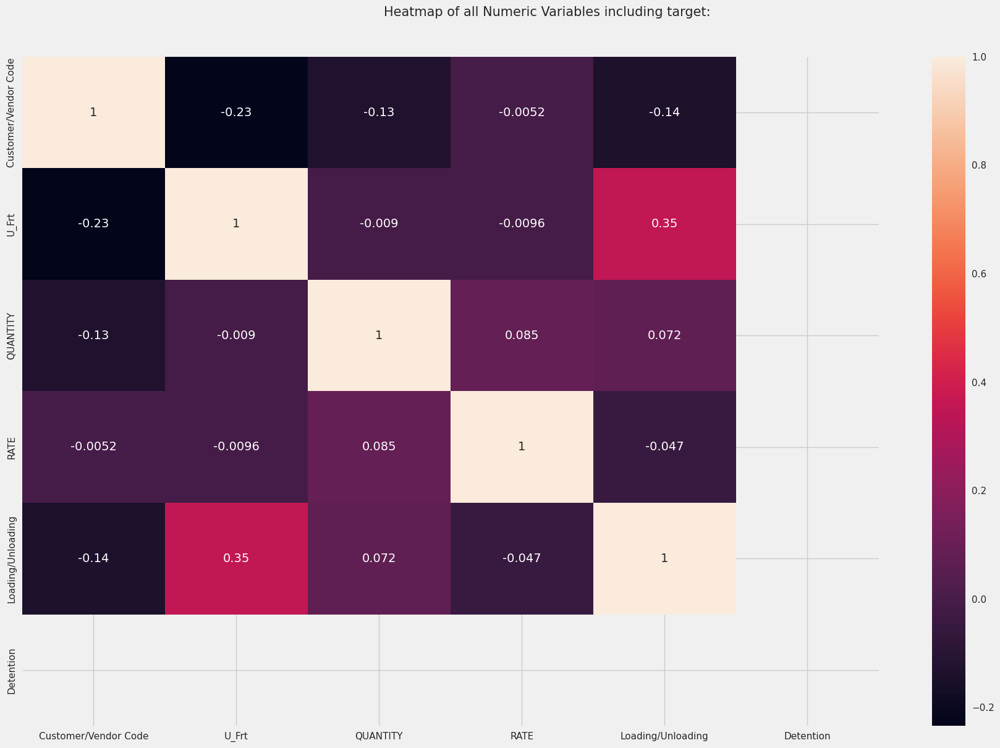

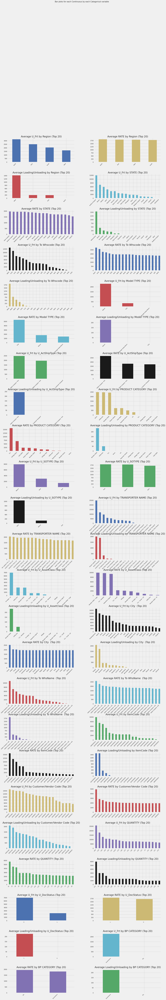

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

Could not draw wordcloud plot for POSTING DATE
Could not draw wordcloud plot for EFFECTIVE DATE
Could not draw wordcloud plot for CREATE DATE


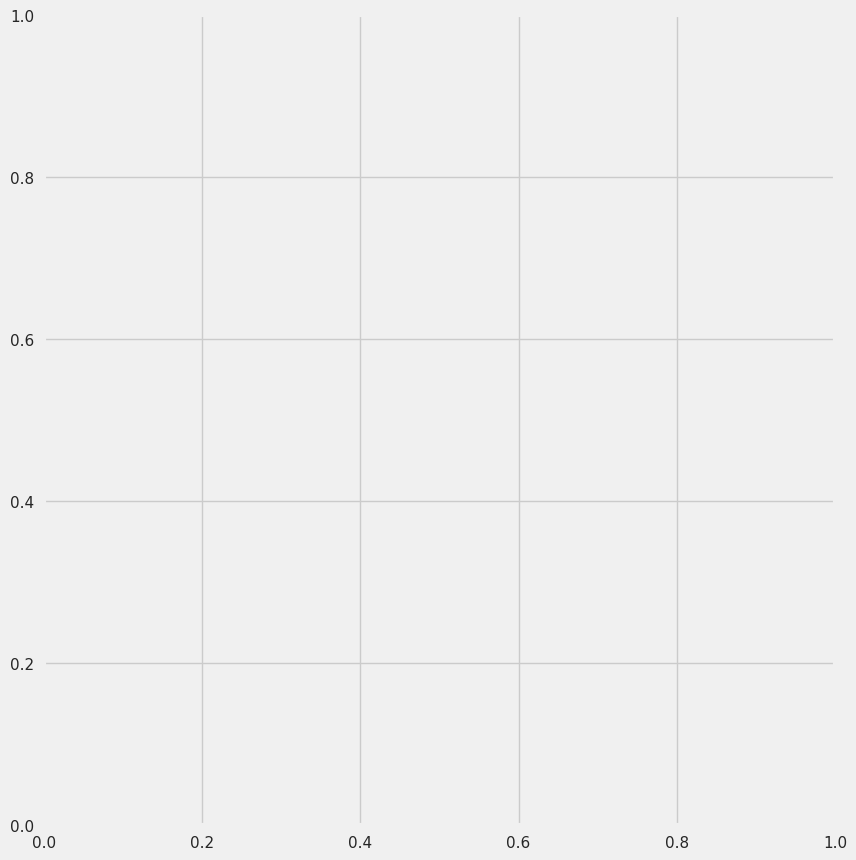

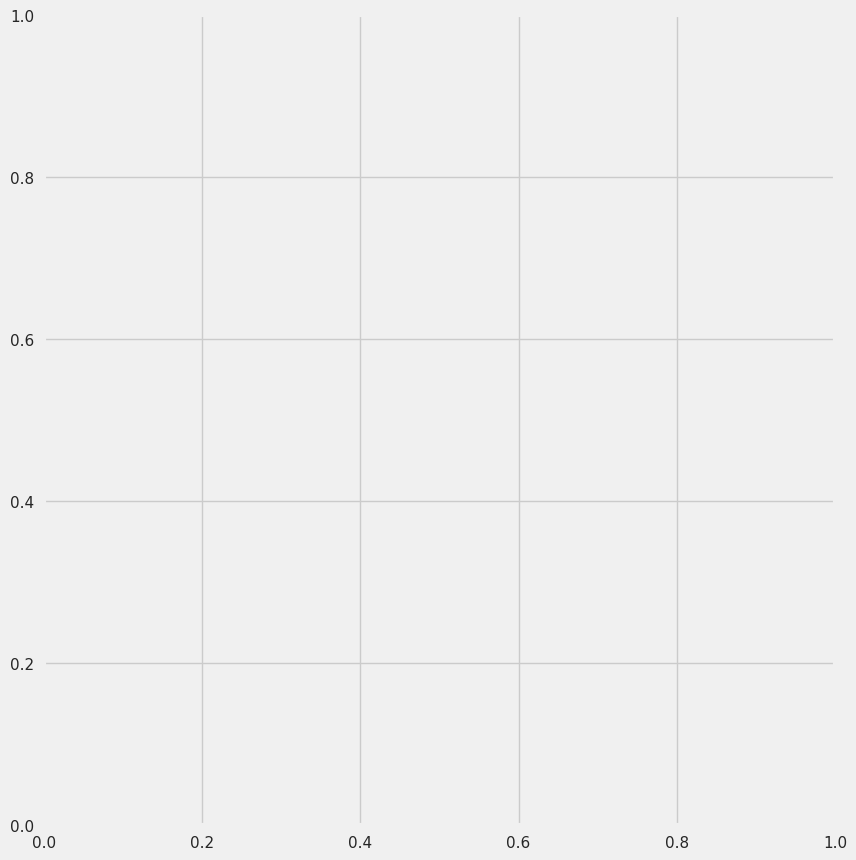

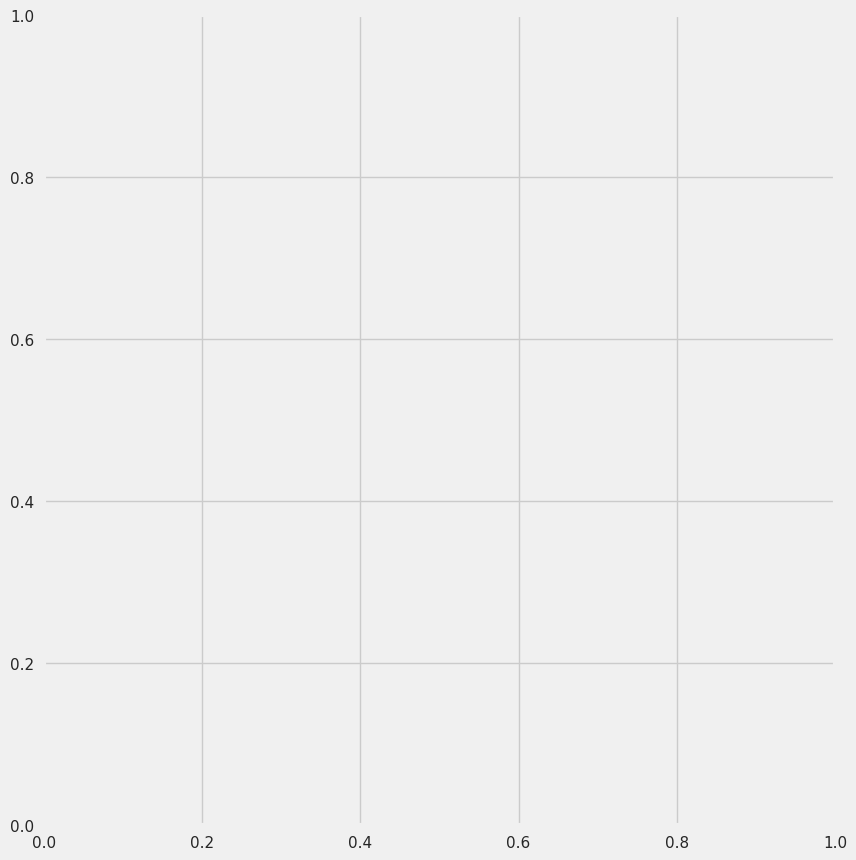

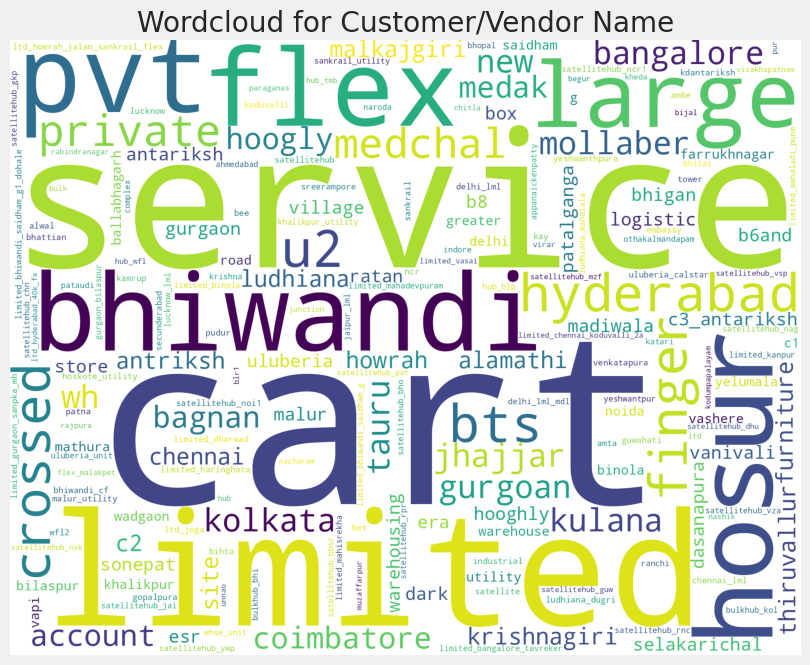

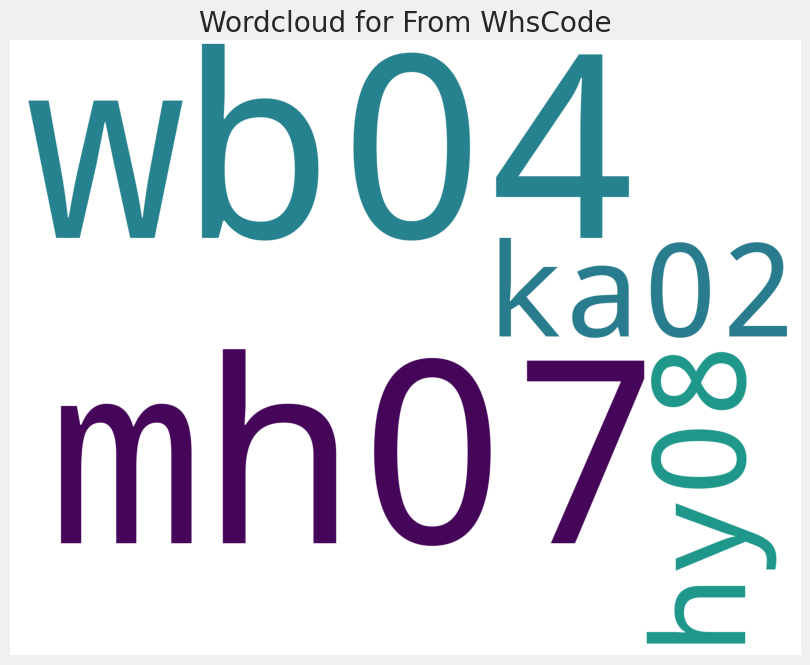

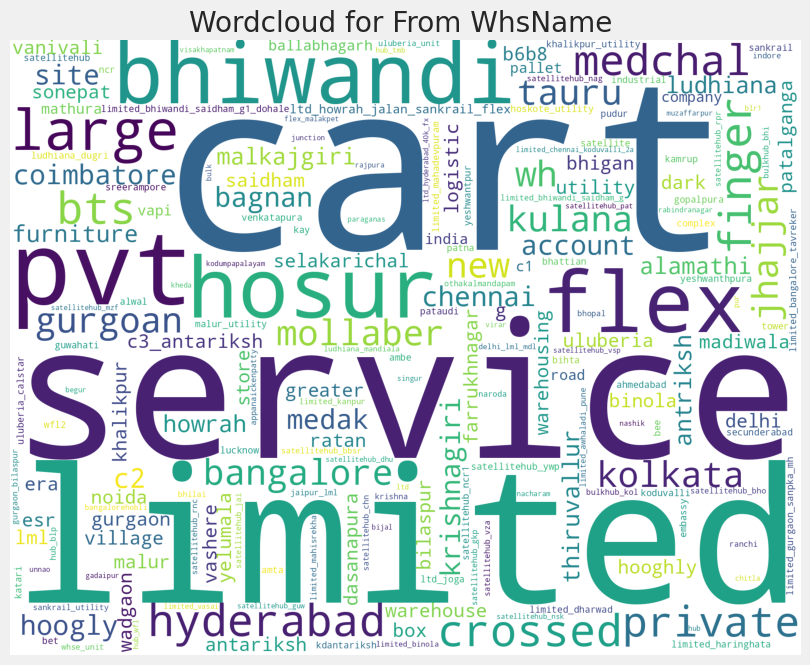

All Plots done
Time to run AutoViz = 89 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()
AV.AutoViz(filename='',dfte=main_dehire)
plt.show()

In [ ]:
df.head()#drop columns

,EFFECTIVE DATE,QUANTITY
0,04/12/2019,-2
1,04/12/2019,-2
2,04/12/2019,-5
3,04/12/2019,-179
4,04/12/2019,-197


In [ ]:
# Converting a column of strings in object format to datetime format
df['EFFECTIVE DATE']=pd.to_datetime(df['EFFECTIVE DATE']) # here convert the date 

In [ ]:
df

,EFFECTIVE DATE,QUANTITY
0,2019-04-12,-2
1,2019-04-12,-2
2,2019-04-12,-5
3,2019-04-12,-179
4,2019-04-12,-197
...,...,...
1833,2022-11-29,-150
1834,2022-11-25,-305
1835,2022-11-26,-305
1836,2022-11-29,-150


In [ ]:
df.set_index('EFFECTIVE DATE',inplace=True)

In [ ]:
main_df =df.loc[:,['QUANTITY']]

In [ ]:
#check the null values
main_df.isnull().sum()

QUANTITY    0
dtype: int64

In [ ]:
# Merging for missing dates
main_df=main_df.groupby(main_df.index).mean()

idx=pd.date_range(start=min(main_df.index), end=max(main_df.index), freq='D')
main_df=main_df.reindex(idx, fill_value=0)

df_weekly=main_df.resample('W').sum()

In [ ]:
main_df=df_weekly.loc[:,['QUANTITY']]
main_df

,QUANTITY
2019-01-13,-320.000000
2019-01-20,0.000000
2019-01-27,0.000000
2019-02-03,0.000000
2019-02-10,0.000000
...,...
2022-11-13,-357.250000
2022-11-20,-927.375000
2022-11-27,-1066.500000
2022-12-04,-842.285714


In [ ]:
# replace the 0 with nan
main_df['QUANTITY'] = np.where(main_df['QUANTITY']==0, np.nan, main_df['QUANTITY'])
main_df

,QUANTITY
2019-01-13,-320.000000
2019-01-20,NaN
2019-01-27,NaN
2019-02-03,NaN
2019-02-10,NaN
...,...
2022-11-13,-357.250000
2022-11-20,-927.375000
2022-11-27,-1066.500000
2022-12-04,-842.285714


In [ ]:
main_df.shape

(205, 1)

In [ ]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 205 entries, 2019-01-13 to 2022-12-11
Freq: W-SUN
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   QUANTITY  146 non-null    float64
dtypes: float64(1)
memory usage: 3.2 KB


##impuatation

## linear interpolation

In [ ]:
#imputataion 
main_df['QUANTITY'] =main_df['QUANTITY'].interpolate()
main_df.isnull().sum()
main_df.head()

,QUANTITY
2019-01-13,-320.0
2019-01-20,-312.0
2019-01-27,-304.0
2019-02-03,-296.0
2019-02-10,-288.0


##Mean Impuatation

In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
main_df['QUANTITY'] = imputer.fit_transform(main_df[['QUANTITY']])
main_df.isnull().sum()
main_df.head()

,QUANTITY
2019-01-13,-320.0
2019-01-20,-312.0
2019-01-27,-304.0
2019-02-03,-296.0
2019-02-10,-288.0


#Forwardfill Imputation

In [ ]:
#imputation
main_df['QUANTITY'] = main_df['QUANTITY'].ffill()
main_df.isnull().sum()
main_df.head()

,QUANTITY
2019-01-13,-320.0
2019-01-20,-312.0
2019-01-27,-304.0
2019-02-03,-296.0
2019-02-10,-288.0


##KNN

In [ ]:
#imputation
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)
main_df['QUANTITY'] = imputer.fit_transform(main_df[['QUANTITY']])
main_df.isnull().sum()
main_df.head()

,QUANTITY
2019-01-13,-320.0
2019-01-20,-312.0
2019-01-27,-304.0
2019-02-03,-296.0
2019-02-10,-288.0


##BackwardFill Impuatation

In [ ]:
#imputation
main_df['QUANTITY'] = main_df['QUANTITY'].fillna(method='bfill')
main_df.isnull().sum()
main_df.head()

,QUANTITY
2019-01-13,-320.0
2019-01-20,-312.0
2019-01-27,-304.0
2019-02-03,-296.0
2019-02-10,-288.0


In [ ]:
main_df.reset_index(inplace =True)

In [ ]:
##saving the impuattation model
main_df.to_excel('dehire_KNN_bestimputed.xlsx',index=False)


In [ ]:
#load the imputed dataset
final_data =pd.read_excel(r'/content/dehire_KNN_bestimputed.xlsx')
final_data

,index,QUANTITY
0,2019-01-13,-320.000000
1,2019-01-20,-312.000000
2,2019-01-27,-304.000000
3,2019-02-03,-296.000000
4,2019-02-10,-288.000000
...,...,...
200,2022-11-13,-357.250000
201,2022-11-20,-927.375000
202,2022-11-27,-1066.500000
203,2022-12-04,-842.285714


In [ ]:
final_data.set_index('index',inplace=True)
final_data.head()

,QUANTITY
index,
2019-01-13,-320.0
2019-01-20,-312.0
2019-01-27,-304.0
2019-02-03,-296.0
2019-02-10,-288.0


In [ ]:
final_data.isnull().sum()

QUANTITY    0
dtype: int64

<Axes: xlabel='index'>

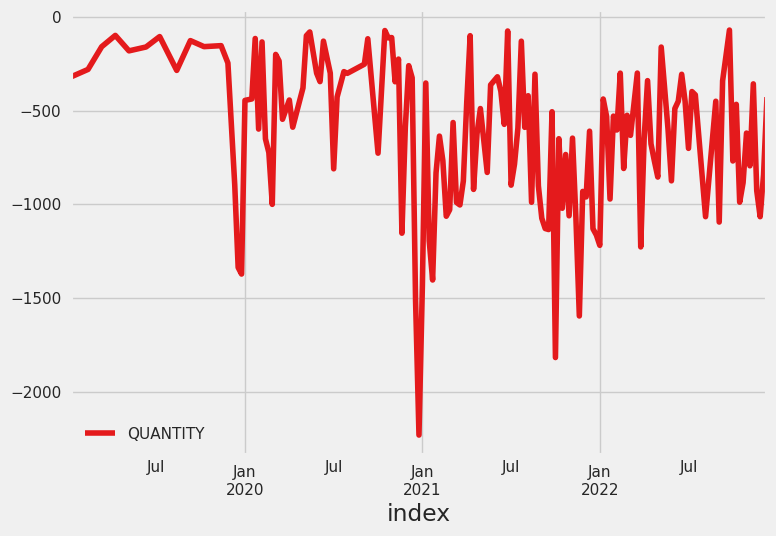

In [ ]:
#plot the data 
final_data.plot(grid=True)


In [ ]:
import statsmodels.api as sm
#Perform seasonal decomposition for Additive
decomposition = sm.tsa.seasonal_decompose(final_data, model ='additive' , period=12)

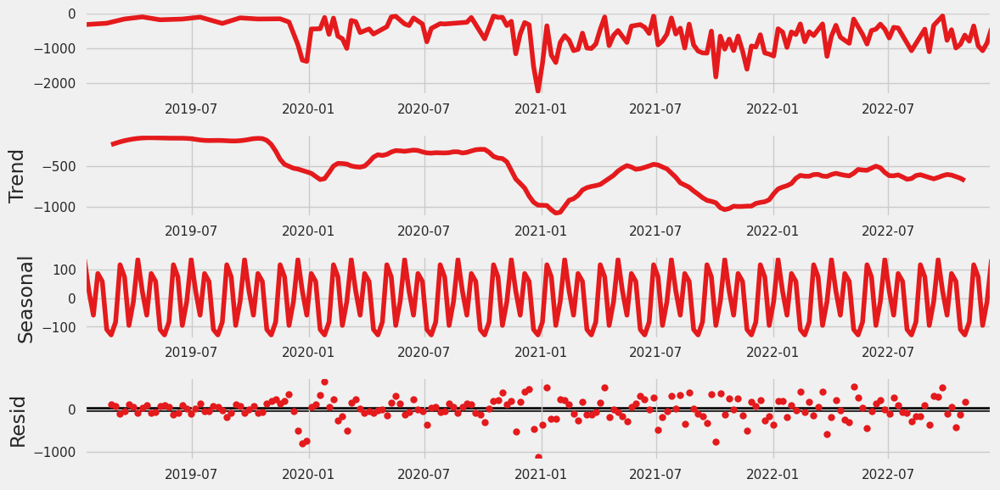

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 6

# Plot the decomposition
fig = decomposition.plot()
plt.show()

##ADF Test

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [99]:
def adf_test(series):
    result = adfuller(series)
    print('ADF Statistics: {}'.format(result[0]))
    print('p- value: {}'.format(result[1]))
    if result[1] >= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against the null hypothesis, fail to reject the null hypothesis. Data has a unit root and is non-stationary")

In [100]:
adf_test(final_data['QUANTITY'])

ADF Statistics: -2.259170029851716
p- value: 0.1854746373720293
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


##ACf & Pacf plot

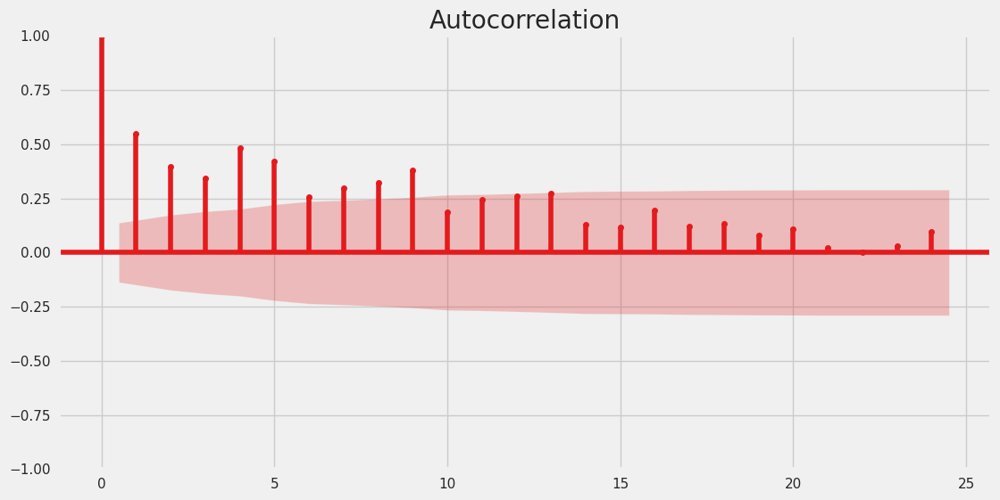

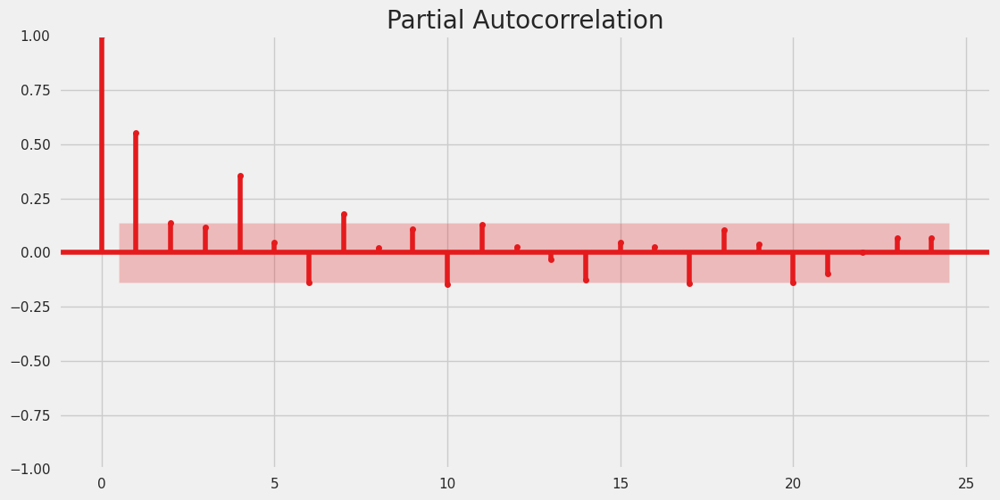

In [ ]:
# if the series is not stationary then make sure to pass differenced series instead of original series
plot_acf(final_data);
plot_pacf(final_data);

###Kwaiatkowski-Phillips-Schmidt-Shin

In [101]:
from statsmodels.tsa.stattools import kpss

def kpss_test(series):
    result = kpss(series)
    print('KPSS Statistics: {}'.format(result[0]))
    print('p- value: {}'.format(result[1]))
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data is stationary")
    else:
        print("weak evidence against the null hypothesis, fail to reject the null hypothesis. Data is non-stationary")

In [102]:
kpss_test(final_data['QUANTITY'])

KPSS Statistics: 1.1485589243562346
p- value: 0.01
strong evidence against the null hypothesis, reject the null hypothesis. Data is stationary


((array([-2.7088841 , -2.40021466, -2.22436022, -2.09847761, -1.99906119,
         -1.91619334, -1.84471334, -1.78157842, -1.72483748, -1.67316142,
         -1.62560232, -1.58145939, -1.54019924, -1.50140611, -1.46474936,
         -1.4299615 , -1.39682292, -1.36515103, -1.33479227, -1.30561622,
         -1.27751112, -1.25038041, -1.22414012, -1.19871667, -1.17404528,
         -1.15006853, -1.12673532, -1.10399994, -1.08182134, -1.0601625 ,
         -1.03898989, -1.01827309, -0.99798434, -0.9780983 , -0.95859171,
         -0.93944323, -0.92063316, -0.90214332, -0.88395686, -0.86605818,
         -0.84843274, -0.83106701, -0.81394837, -0.79706499, -0.78040581,
         -0.76396046, -0.74771918, -0.73167277, -0.71581259, -0.70013046,
         -0.68461865, -0.66926986, -0.65407714, -0.63903392, -0.62413394,
         -0.60937126, -0.59474021, -0.58023538, -0.56585161, -0.55158398,
         -0.53742776, -0.52337843, -0.50943166, -0.49558329, -0.48182931,
         -0.46816589, -0.45458932, -0.

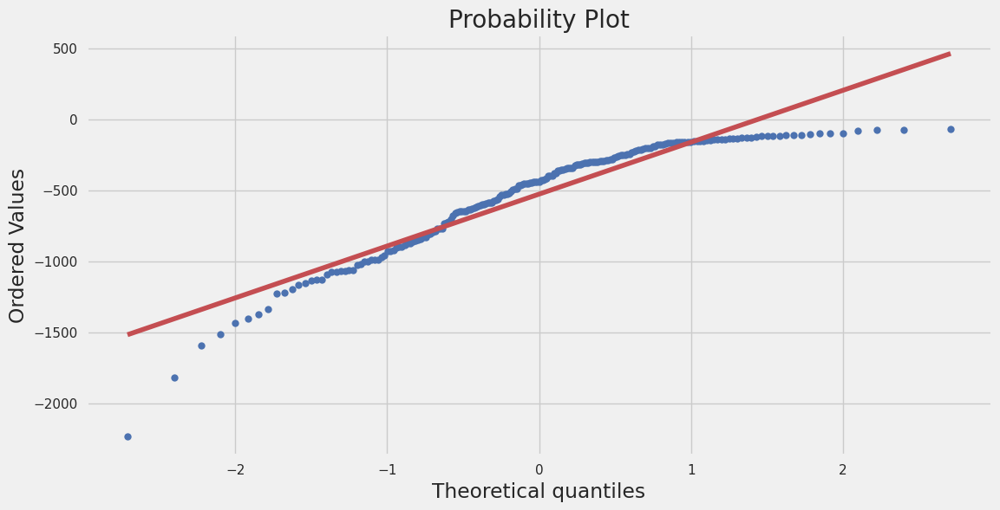

In [ ]:
# Checking  data is normally distributed or not 
stats.probplot(final_data.QUANTITY, dist="norm", plot=plt)

##splitting dat into train and test

In [ ]:
#split the dta into train and test
#split =int(len(final_data)*0.80)

In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(final_data, test_size = 0.2, shuffle = False)


In [ ]:
from datetime import datetime, timedelta

train_dataset_end=train_df.index[-1]
test_dataset_end=test_df.index[-1:]

In [ ]:
#train_df = final_data[:split]
train_df.shape

(164, 1)

In [ ]:
#test_df = final_data[split:]
test_df.shape

(41, 1)

### Auto ML Using PyCaret Library

In [ ]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 48.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 5.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 15.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  

In [ ]:
from pycaret.datasets import get_data
from pycaret.regression import *
from datetime import datetime, timedelta

In [ ]:
# Initialize the regression setup using PyCaret
reg_setup = setup(train_df, target='QUANTITY', session_id=123, 
                  data_split_shuffle=False, fold_strategy='timeseries')

,Description,Value
0,Session id,123
1,Target,QUANTITY
2,Target type,Regression
3,Original data shape,"(164, 1)"
4,Transformed data shape,"(164, 1)"
5,Transformed train set shape,"(114, 1)"
6,Transformed test set shape,"(50, 1)"
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


In [ ]:
# Train multiple models and select the best one using PyCaret's AutoML
best_model = compare_models(include=['lr', 'lasso', 'ridge', 'en', 'lar', 'llar', 'omp', 'br', 
                                     'ard', 'par', 'ransac', 'tr', 'huber', 'kr', 'svm', 
                                     'knn', 'dt', 'rf', 'et', 'ada', 'gbr', 'mlp', 'xgboost', 
                                     'lightgbm'], sort='MAPE', n_select=1)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,237.4468,168627.7166,311.6983,-3.1278,0.6804,0.5212,0.3130


Processing:   0%|          | 0/101 [00:00<?, ?it/s]

# Model Building

ARIMA

In [ ]:
# we got the p,d,q value from time series analysis
arima = ARIMA(train_df, order=(1,1,1)).fit()
arima_train_pred = arima.fittedvalues
arima_test_pred = arima.forecast(41)

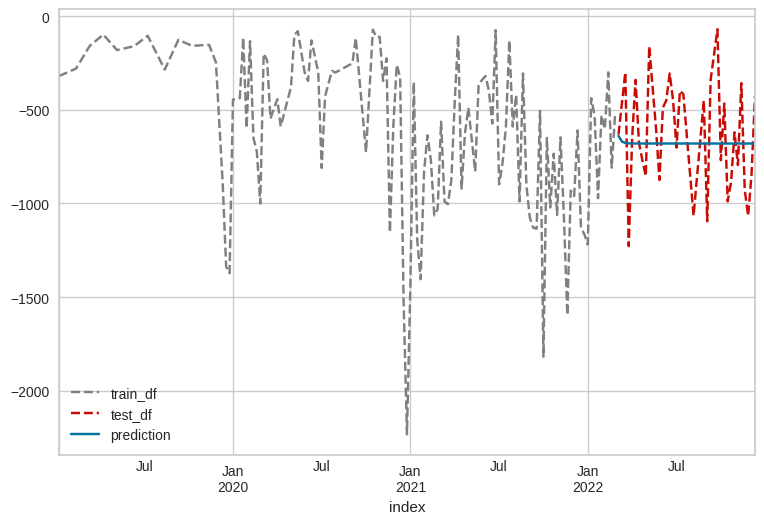

In [ ]:
train_df['QUANTITY'].plot(style='--', color='gray', legend=True, label='train_df')
test_df['QUANTITY'].plot(style='--', color='r', legend=True, label='test_df')
arima_test_pred.plot(color='b', legend=True, label='prediction')
plt.show()

In [ ]:
print('Train RMSE:',mean_squared_error(train_df, arima_train_pred)**0.5)
print('Test RMSE:',mean_squared_error(test_df, arima_test_pred)**0.5)
print('Train MAPE:',mean_absolute_percentage_error(train_df, arima_train_pred))
print('Test MAPE:',mean_absolute_percentage_error(test_df, arima_test_pred))

Train RMSE: 311.4909413059427
Test RMSE: 281.04013885752033
Train MAPE: 0.5626161898363602
Test MAPE: 0.7164139057477436


In [ ]:
# ARIMA evaluate
def evaluate_arima_model(arima_order):
    # prepare training dataset
    train_df = final_data[:split]
    test_df = final_data[split:]
    # make predictions
    model = ARIMA(train_df, order=arima_order).fit()
    model_pred = model.forecast(41)
    rmse = (mean_squared_error(test_df, model_pred)**0.5)
    return rmse

In [ ]:
# evaluate combination of ARIMA p q values 
def evaluate_models(dataset, p_values, q_values):
	dataset = dataset.astype('float32')
	best_score, best_cfg = float("inf"), None
	for p in p_values:
		for q in q_values:
				order = (p,1,q)
				try:
					rmse = evaluate_arima_model(order)
					if rmse < best_score:
						best_score, best_cfg = rmse, order
					
				except:
					continue
	print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))


In [ ]:
# evaluate parameters
p_values = [1,2,3]
q_values = [1,18]

evaluate_models(main_df['QUANTITY'].values, p_values, q_values)

Best ARIMANone RMSE=inf


In [ ]:
arima = ARIMA(train_df['QUANTITY'], order=(3,1,1)).fit()
arima_train_pred = arima.predict()
arima_test_pred = arima.forecast(41)

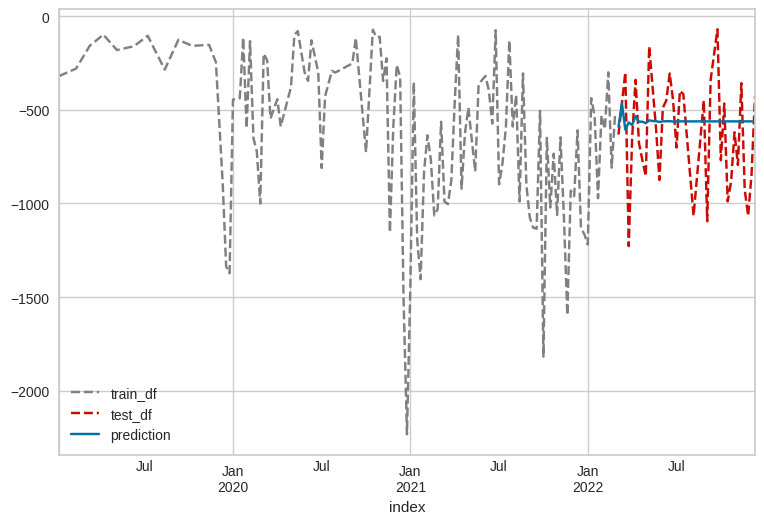

In [ ]:
train_df['QUANTITY'].plot(style='--', color='gray', legend=True, label='train_df')
test_df['QUANTITY'].plot(style='--', color='r', legend=True, label='test_df')
arima_test_pred.plot(color='b', legend=True, label='prediction')
plt.show()

In [ ]:
print('Train RMSE:',mean_squared_error(train_df, arima_train_pred)**0.5)
print('Test RMSE:',mean_squared_error(test_df, arima_test_pred)**0.5)
print('Train MAPE:',mean_absolute_percentage_error(train_df, arima_train_pred))
print('Test MAPE:',mean_absolute_percentage_error(test_df, arima_test_pred))

Train RMSE: 302.0873756261341
Test RMSE: 280.97437306612073
Train MAPE: 0.5591240836049712
Test MAPE: 0.5893174116864234


## Double Exponential smoothing 

In [ ]:
double_exs = ExponentialSmoothing(train_df, trend=None, initialization_method='heuristic', seasonal='add', seasonal_periods=29, damped_trend=False).fit()
double_exs_train_pred = double_exs.fittedvalues
double_exs_test_pred = double_exs.forecast(41)

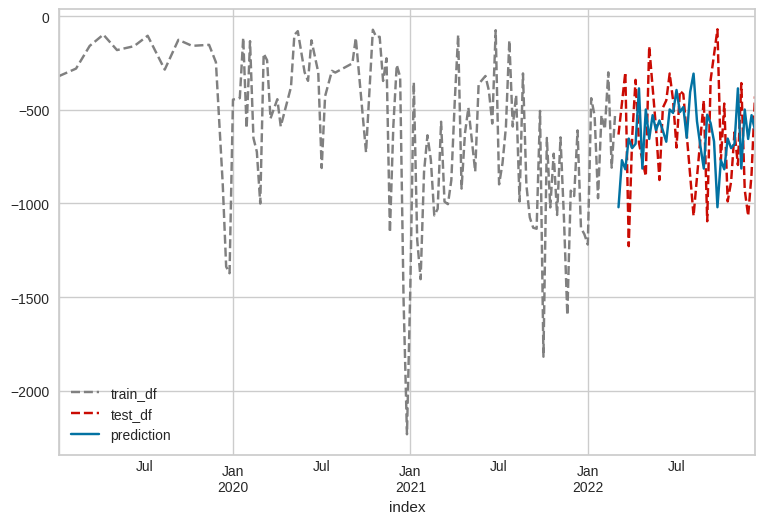

In [ ]:
train_df['QUANTITY'].plot(style='--', color='gray', legend=True, label='train_df')
test_df['QUANTITY'].plot(style='--', color='r', legend=True, label='test_df')
double_exs_test_pred.plot(color='b', legend=True, label='prediction')
plt.show()

In [ ]:
print('Train RMSE:',mean_squared_error(train_df, double_exs_train_pred)**0.5)
print('Test RMSE:',mean_squared_error(test_df, double_exs_test_pred)**0.5)
print('Train MAPE:',mean_absolute_percentage_error(train_df, double_exs_train_pred))
print('Test MAPE:',mean_absolute_percentage_error(test_df, double_exs_test_pred))

Train RMSE: 283.4418516120714
Test RMSE: 362.32945675823885
Train MAPE: 0.6306526680721991
Test MAPE: 0.8790431310596518


## sarima

In [ ]:
# seasonal order order used using auto arima 
sarima = SARIMAX(train_df['QUANTITY'], order=(0,1,0), seasonal_order=(1,0,0,30)).fit()
sarima_train_pred = sarima.predict()
sarima_test_pred = sarima.forecast(41)

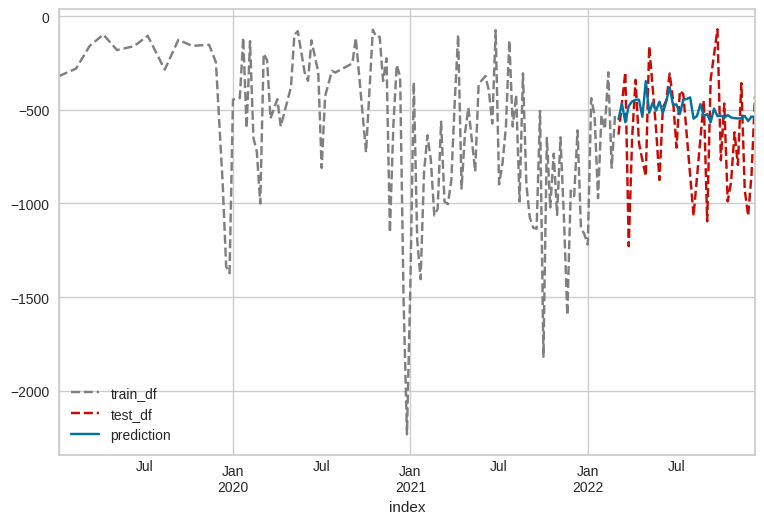

In [ ]:
train_df['QUANTITY'].plot(style='--', color='gray', legend=True, label='train_df')
test_df['QUANTITY'].plot(style='--', color='r', legend=True, label='test_df')
sarima_test_pred.plot(color='b', legend=True, label='prediction')
plt.show()

In [ ]:
print('Train RMSE:',mean_squared_error(train_df, sarima_train_pred)**0.5)
print('Test RMSE:',mean_squared_error(test_df, sarima_test_pred)**0.5)
print('Train MAPE:',mean_absolute_percentage_error(train_df, sarima_train_pred))
print('Test MAPE:',mean_absolute_percentage_error(test_df, sarima_test_pred))

Train RMSE: 358.232660217727
Test RMSE: 303.0767089403687
Train MAPE: 0.5560326664382362
Test MAPE: 0.5560742945143949


##LSTM

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.preprocessing import RobustScaler

In [ ]:
#split the data into train and test
split = int(len(final_data)*0.70)

In [ ]:
train_df = final_data[:split]
train_df.shape

(143, 1)

In [ ]:
test_df = final_data[split:]
test_df.shape

(62, 1)

In [ ]:
#scale the data 
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train_df)
test_scaled = scaler.transform(test_df)

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression

In [ ]:
pipe = Pipeline([
    ('s', RobustScaler(copy=True)),
    ('lr', LinearRegression())
])

In [ ]:
pipe.fit(train_df,train_df)

Pipeline(steps=[('s', RobustScaler()), ('lr', LinearRegression())])

In [ ]:
# Define function to create LSTM model
def create_lstm_model():
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(train_scaled.shape[1], 1)))
    model.add(LSTM(units=50))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

In [ ]:
# Train and evaluate LSTM model
model = create_lstm_model()
model.fit(train_scaled, train_scaled, epochs=30, batch_size=16, verbose=2)

Epoch 1/30
9/9 - 7s - loss: 0.9142 - 7s/epoch - 800ms/step
Epoch 2/30
9/9 - 0s - loss: 0.8539 - 62ms/epoch - 7ms/step
Epoch 3/30
9/9 - 0s - loss: 0.7878 - 63ms/epoch - 7ms/step
Epoch 4/30
9/9 - 0s - loss: 0.6986 - 58ms/epoch - 6ms/step
Epoch 5/30
9/9 - 0s - loss: 0.6089 - 67ms/epoch - 7ms/step
Epoch 6/30
9/9 - 0s - loss: 0.4949 - 57ms/epoch - 6ms/step
Epoch 7/30
9/9 - 0s - loss: 0.3591 - 69ms/epoch - 8ms/step
Epoch 8/30
9/9 - 0s - loss: 0.2426 - 61ms/epoch - 7ms/step
Epoch 9/30
9/9 - 0s - loss: 0.1475 - 58ms/epoch - 6ms/step
Epoch 10/30
9/9 - 0s - loss: 0.0900 - 60ms/epoch - 7ms/step
Epoch 11/30
9/9 - 0s - loss: 0.0509 - 56ms/epoch - 6ms/step
Epoch 12/30
9/9 - 0s - loss: 0.0286 - 55ms/epoch - 6ms/step
Epoch 13/30
9/9 - 0s - loss: 0.0163 - 53ms/epoch - 6ms/step
Epoch 14/30
9/9 - 0s - loss: 0.0117 - 53ms/epoch - 6ms/step
Epoch 15/30
9/9 - 0s - loss: 0.0097 - 56ms/epoch - 6ms/step
Epoch 16/30
9/9 - 0s - loss: 0.0091 - 57ms/epoch - 6ms/step
Epoch 17/30
9/9 - 0s - loss: 0.0084 - 61ms/epoch 

In [ ]:
# Make predictions on test set
test_inputs = test_scaled[:-1]
test_labels = test_scaled[1:]
test_preds = model.predict(test_inputs.reshape((test_inputs.shape[0], test_inputs.shape[1], 1)))
test_preds = scaler.inverse_transform(test_preds).reshape((-1))

2/2 [==============================] - 1s 6ms/step


In [ ]:
# Calculate evaluation metrics
test_rmse = np.sqrt(np.mean(np.square(test_preds - test_df['QUANTITY'].values[1:])))
test_mape = np.mean(np.abs(test_preds - test_df['QUANTITY'].values[1:]) / test_df['QUANTITY'].values[1:]) 
print(f"Test RMSE: {test_rmse:.2f}")
print(f"Test MAPE: {test_mape:.2f}")

Test RMSE: 388.86
Test MAPE: -0.59


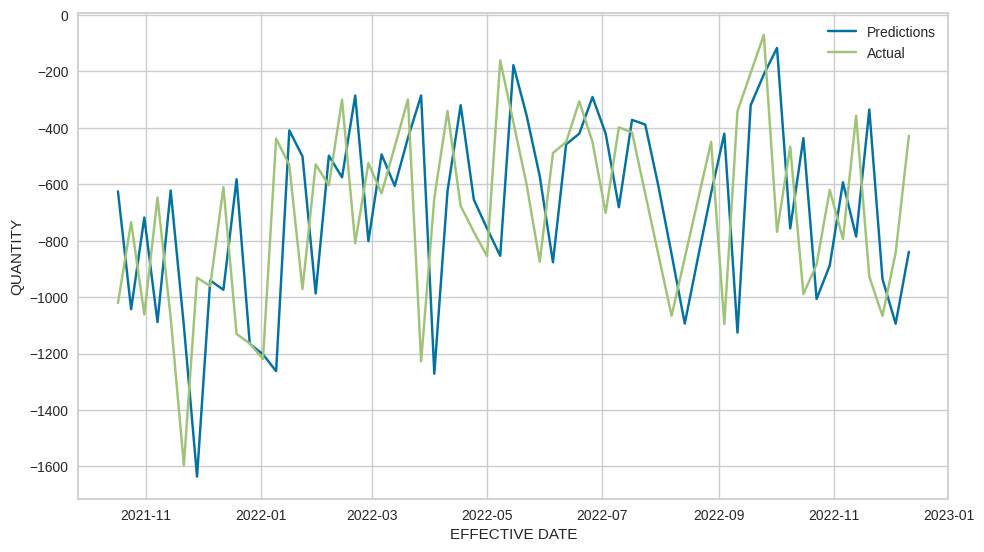

In [ ]:
# Plot predictions and actual values
plt.figure(figsize=(10,6))
plt.plot(test_df.index[1:], test_preds, label='Predictions')
plt.plot(test_df.index[1:], test_df['QUANTITY'].values[1:], label='Actual')
plt.xlabel('EFFECTIVE DATE')
plt.ylabel('QUANTITY')
plt.legend()
plt.show()

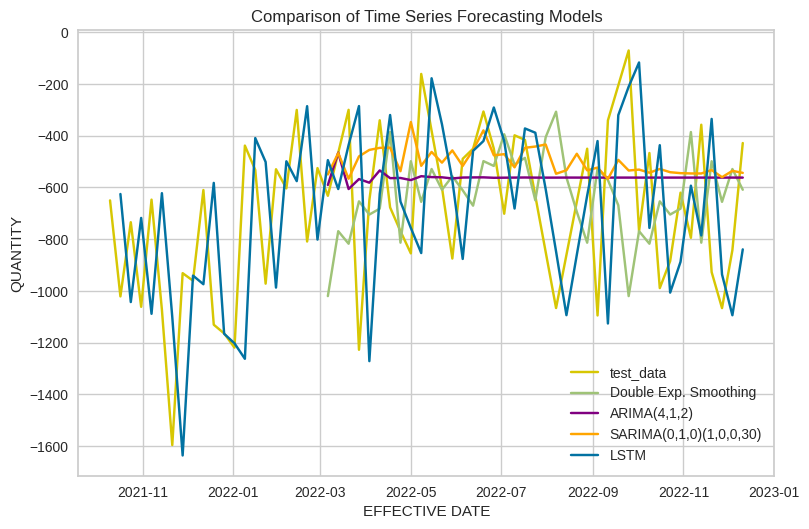

In [ ]:
# Plot the data
plt.plot(test_df['QUANTITY'], color='y', label='test_data')
plt.plot(double_exs_test_pred, color='g', label='Double Exp. Smoothing')
plt.plot(arima_test_pred, color='purple', label='ARIMA(4,1,2)')
plt.plot(sarima_test_pred, color='orange', label='SARIMA(0,1,0)(1,0,0,30)')
plt.plot(test_df.index[1:], test_preds, color='b', label='LSTM')

# Add axis labels and title
plt.xlabel('EFFECTIVE DATE')
plt.ylabel('QUANTITY')
plt.title('Comparison of Time Series Forecasting Models')

# Add legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
#Dumping the python file into pickle
with open("lstm.pickle","wb") as f:
  pickle.dump(model,f)

In [ ]:
#Deployment
with open("lstm.pickle","rb") as f:
  loaded_data = pickle.load(f)
  print(loaded_data) 